In [469]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.dates as mdates
import os
import glob
import seaborn as sns
import datetime as dt
import statsmodels as sm
mpl.rcParams['font.size'] = 9 # This should set the size to 9pt

In [506]:
#import all the .csv we have for bike data
bike_data = pd.concat(map(pd.read_csv, glob.glob(os.path.join('', "Datasets/bike_data*.csv"))))
daily_covid_data = pd.read_csv("Datasets/daily_covid_authority.csv")
weather_2019 = pd.read_csv("Datasets/weather2019.csv")

In [507]:
#basic cleaning
(bike_data.isna().sum()) 
bike_data['started_at'] = pd.to_datetime(bike_data['started_at']).dt.tz_localize(None) #convert to dateTime
bike_data['ended_at'] = pd.to_datetime(bike_data['ended_at']).dt.tz_localize(None)
bike_data = bike_data.drop(['start_station_description','end_station_description'], axis=1) #not needed
bike_data = bike_data[((bike_data.duration >= 150) & (bike_data.duration <= 7200))] #filter times

#Clean COVID data from gov.scot
daily_covid_data = daily_covid_data.loc[daily_covid_data['CAName'] == 'City of Edinburgh']
daily_covid_data['Date'] = pd.to_datetime(daily_covid_data['Date'],format="%Y%m%d")

#Clean weather data for 2019
#There are NaN but we will not use these columns, the temps have none
weather_2019['date'] = pd.to_datetime(weather_2019['date'])

daily_covid_data.info()
bike_data.info()
weather_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 394 entries, 21 to 12597
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    394 non-null    datetime64[ns]
 1   CA                      394 non-null    object        
 2   CAName                  394 non-null    object        
 3   DailyPositive           394 non-null    int64         
 4   CumulativePositive      394 non-null    int64         
 5   CrudeRatePositive       394 non-null    float64       
 6   CrudeRate7DayPositive   388 non-null    float64       
 7   DailyDeaths             394 non-null    int64         
 8   CumulativeDeaths        394 non-null    int64         
 9   CrudeRateDeaths         394 non-null    float64       
 10  DailyNegative           394 non-null    int64         
 11  CumulativeNegative      394 non-null    int64         
 12  CrudeRateNegative       394 non-null    float64

In [503]:
#Finding flaws in the data. Chose to use station_name over ID
bike_data['start_station_name'] = bike_data['start_station_name'].str.replace('Bruntsfield links', 'Bruntsfield Links')
bike_data['end_station_name'] = bike_data['end_station_name'].str.replace('Bruntsfield links', 'Bruntsfield Links')

bike_data['start_station_name'] = bike_data['start_station_name'].str.replace('Picady Place', 'Picardy Place')
bike_data['end_station_name'] = bike_data['end_station_name'].str.replace('Picady Place', 'Picardy Place')


#test = bike_data[['start_station_name']].drop_duplicates()
#test = test.sort_values(by='start_station_name')
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#        print(test)



In [473]:
#Count Cramond beginning and end

cram = bike_data[['started_at','start_station_name','end_station_name']]

cram = cram[(cram.started_at >= '2020-03-23') & (cram.started_at < '2020-06-01')]
cram = cram[cram.start_station_name == 'Cramond Foreshore']
cram_same = cram[(cram.start_station_name == cram.end_station_name)].count()
print(cram_same/cram.count())
cram.head()

started_at            0.401813
start_station_name    0.401813
end_station_name      0.401813
dtype: float64


,started_at,start_station_name,end_station_name
10642,2020-03-23 16:43:48.216,Cramond Foreshore,Cramond Foreshore
10643,2020-03-23 16:43:55.364,Cramond Foreshore,Cramond Foreshore
10651,2020-03-23 17:02:17.502,Cramond Foreshore,Cramond Foreshore
10652,2020-03-23 17:02:59.568,Cramond Foreshore,Cramond Foreshore
10819,2020-03-24 11:09:55.221,Cramond Foreshore,Dalry Road Lidl


<ipython-input-544-c09593abec49>:6: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  rides_2019 = (rides_2019.groupby(rides_2019.dt.weekofyear).count()).reset_index(name='rides_taken')
<ipython-input-544-c09593abec49>:12: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  temp_2019 = (temp_2019.groupby(temp_2019.date.dt.weekofyear).mean()).reset_index()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 1 to 52
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rides_taken      52 non-null     int64  
 1   tavg             52 non-null     float64
 2   prcp             52 non-null     float64
 3   wspd             52 non-null     float64
 4   pres             52 non-null     float64
 5   tmin             52 non-null     float64
 6   tmax             52 non-null     float64
 7   log_rides_taken  52 non-null     float64
 8   season           52 non-null     object 
dtypes: float64(7), int64(1), object(1)
memory usage: 4.1+ KB


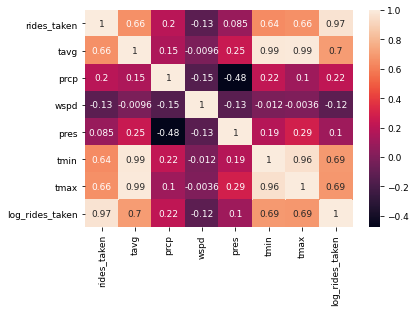

In [544]:
#Correlation between weather and usage in 2019 - setup

rides_2019 = bike_data['started_at']
rides_2019 = rides_2019[(rides_2019 >= '2019-01-01') & (rides_2019 < '2020-01-01')]

rides_2019 = (rides_2019.groupby(rides_2019.dt.weekofyear).count()).reset_index(name='rides_taken')
rides_2019 = rides_2019.rename(columns={'started_at' : 'date'})


temp_2019 = weather_2019[['date','tavg','prcp','wspd','pres','tmin','tmax']]
temp_2019 = temp_2019[(temp_2019.date >= '2019-01-01') & (temp_2019.date < '2020-01-01')]
temp_2019 = (temp_2019.groupby(temp_2019.date.dt.weekofyear).mean()).reset_index()

merged_2019 = pd.merge(rides_2019,temp_2019, how='outer', on='date') 
merged_2019.insert(loc = len(merged_2019.columns), column = 'log_rides_taken', value = merged_2019['rides_taken'].apply(np.log10))
merged_2019 = merged_2019.set_index('date')

myDict={1:'Winter', 2:'Winter', 3:'Spring', 4:'Spring', 5:'Spring', 6:'Summer', 7:'Summer', 8:'Summer', 9:'Autumn', 10:'Autumn', 11:'Autumn', 12:'Winter'}
merged_2019['season'] = pd.to_datetime(merged_2019.index.map(lambda x:('2019-' + str(x+1) +'-1')), format='%Y-%W-%w').month.map(myDict)

merged_2019 = merged_2019.dropna()
sns.heatmap(merged_2019.corr(), annot=True)
merged_2019.info()

In [341]:
#Correlation between weather and usage in 2019 - part III regression
model1 = smf.ols('rides_taken ~ tavg', data=merged_2019)
results1 = model1.fit()
results1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rides_taken   R-squared:                       0.439
Model:                            OLS   Adj. R-squared:                  0.427
Method:                 Least Squares   F-statistic:                     39.06
Date:                Sun, 04 Apr 2021   Prob (F-statistic):           8.94e-08
Time:                        04:06:22   Log-Likelihood:                -415.08
No. Observations:                  52   AIC:                             834.2
Df Residuals:                      50   BIC:                             838.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    907.6118    239.558      3.789      0.000     426.446    1388.778
tavg         145.6122     23.298      6.250      0.000      98.816     192.408
==============================================================================
Omnibus:                       22.871   Durbin-Watson:                   0.962
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               38.960
Skew:                           1.387   Prob(JB):                     3.47e-09
Kurtosis:                       6.207   Cond. No.                         24.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [342]:
model2 = smf.ols('log_rides_taken ~ tavg', data=merged_2019)
results2 = model2.fit()
results2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        log_rides_taken   R-squared:                       0.490
Model:                            OLS   Adj. R-squared:                  0.480
Method:                 Least Squares   F-statistic:                     48.08
Date:                Sun, 04 Apr 2021   Prob (F-statistic):           7.62e-09
Time:                        04:06:22   Log-Likelihood:                 28.155
No. Observations:                  52   AIC:                            -52.31
Df Residuals:                      50   BIC:                            -48.41
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.0143      0.048     63.333      0.000       2.919       3.110
tavg           0.0321      0.005      6.934      0.000       0.023       0.041
==============================================================================
Omnibus:                        2.570   Durbin-Watson:                   0.696
Prob(Omnibus):                  0.277   Jarque-Bera (JB):                1.723
Skew:                           0.413   Prob(JB):                        0.423
Kurtosis:                       3.334   Cond. No.                         24.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

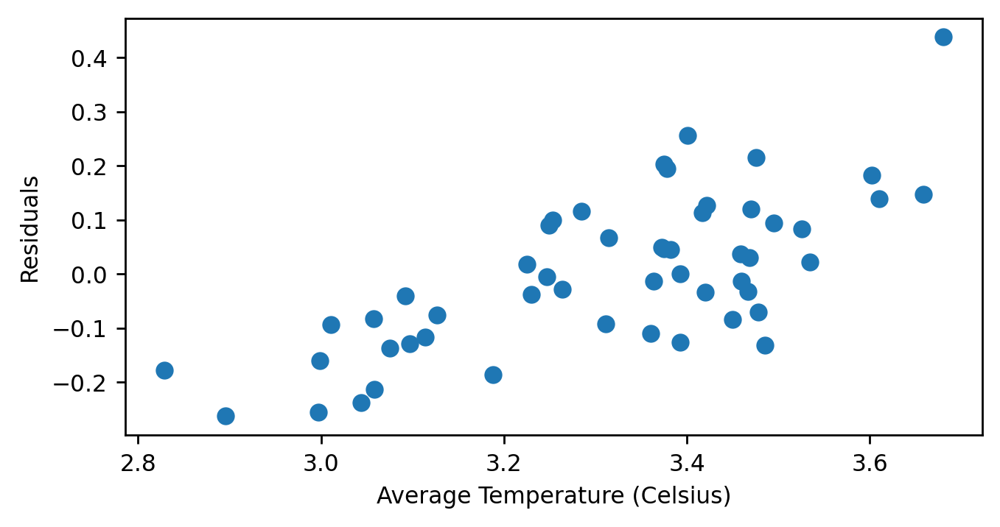

In [373]:
#Residuals
fig, ax = plt.subplots(figsize=(6,3), dpi=250)
#ax[0].scatter(x = merged_2019_daily['rides_taken'], y=results1.resid)
ax.scatter(x = merged_2019['log_rides_taken'], y=results2.resid)
plt.ylabel("Residuals")
plt.xlabel("Average Temperature (Celsius)")
plt.savefig('visualisations/8.2.pdf', bbox_inches='tight')

Intercept    3.014329
tavg         0.032096
dtype: float64

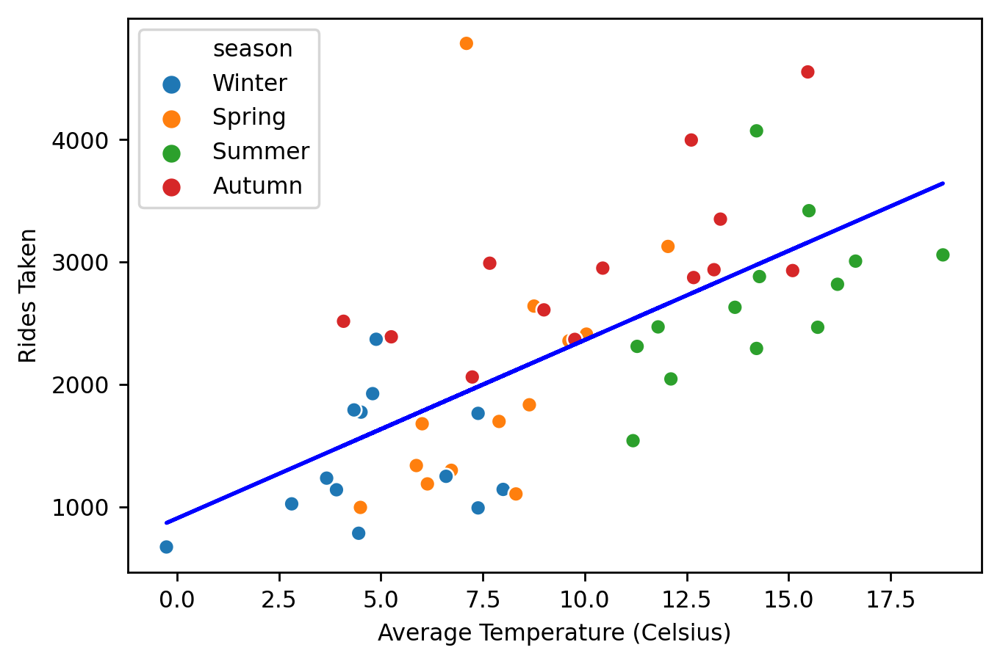

In [548]:
fig, ax = plt.subplots(figsize=(6,4), dpi=250)
sns.scatterplot(data=merged_2019, x='tavg', y='rides_taken',hue='season')
plt.xlabel('Average Temperature (Celsius)')
plt.ylabel('Rides Taken')
y_hat = results1.predict(merged_2019['tavg'])
plt.plot(merged_2019['tavg'], y_hat, color='b')
#plt.title("Temperature vs Bike Usage")
plt.savefig('visualisations/8.1.pdf', bbox_inches='tight')
results2.params

In [456]:
#Popular starting stations before and during

station_pop = bike_data
station_pop['popularity'] = 0
#station_pop['haversine_dist_start'] = haversine_vectorize(-3.189223922703719, 55.9441040959390, station_pop['start_station_longitude'], station_pop['start_station_latitude'])

station_pop1 = station_pop[(station_pop.started_at >= '2019-01-23') & (station_pop.started_at < '2019-06-01')]
station_pop1 = (station_pop1.groupby(station_pop1.start_station_name).count()).reset_index()
station_pop1 = station_pop1[['start_station_name','popularity']]
station_pop1 = station_pop1.sort_values(by='popularity', ascending=False)

station_pop2 = station_pop[(station_pop.started_at >= '2020-03-23') & (station_pop.started_at < '2020-06-01')]
station_pop2 = (station_pop2.groupby(station_pop2.start_station_name).count()).reset_index()
station_pop2 = station_pop2[['start_station_name','popularity']]
station_pop2 = station_pop2.sort_values(by='popularity', ascending=False)

print(station_pop1.head(5))
print("\n\n")
print(station_pop2.head(5))

   start_station_name  popularity
1       Bristo Square        1847
46       Meadows East        1486
66   St Andrew Square        1413
57         Portobello        1391
28      George Square        1219



         start_station_name  popularity
78  Portobello - Kings Road        2269
25              Duke Street        1816
19        Cramond Foreshore        1655
96            Victoria Quay        1408
67             Meadow Place        1208


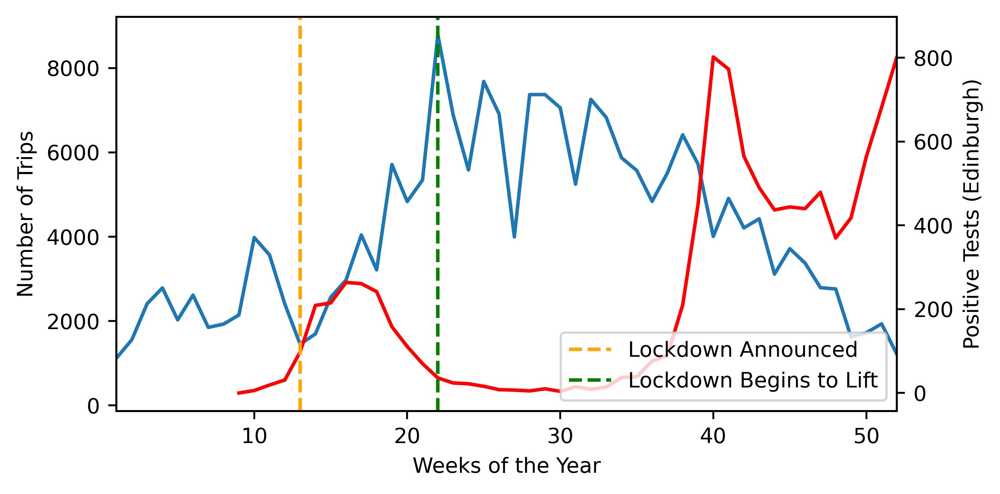

In [346]:
#Rides per week compared to cases per week
days = bike_data['started_at']

days = days[(days >= '2020-01-01') & (days <= '2020-12-31')]
days = (days.groupby(days.dt.isocalendar().week).count())

cases = daily_covid_data[['Date','DailyPositive']]
cases = cases[(cases.Date >= '2020-01-01') & (cases.Date <= '2020-12-31')]
cases = (cases.groupby(cases.Date.dt.isocalendar().week).sum())


fig, ax = plt.subplots(figsize=(6,3),dpi=500)
plt.plot(days)
ax2=plt.twinx()
ax2.plot(cases, color='red')

ax.set_ylabel('Number of Trips')
ax.set_xlabel('Weeks of the Year')
ax2.set_ylabel('Positive Tests (Edinburgh)')
plt.xticks(rotation=45)
ax.set_xlim(left=1)
ax.set_xlim(right=52)

plt.axvline(pd.Timestamp('2020-03-26').week, color='orange', linestyle='dashed',label='Lockdown Announced')
plt.axvline(pd.Timestamp('2020-05-28').week, color='green', linestyle='dashed', label='Lockdown Begins to Lift')

#plt.title("Bike Usage and Confirmed Cases in 2020")

#date_form = DateFormatter("%m-%d")
#ax.xaxis.set_major_formatter(date_form)
plt.legend(loc='lower right')
#plt.legend(bbox_to_anchor=(0, -1),
#              loc='lower left')
plt.tight_layout()
plt.savefig('visualisations/.pdf', bbox_inches='tight')

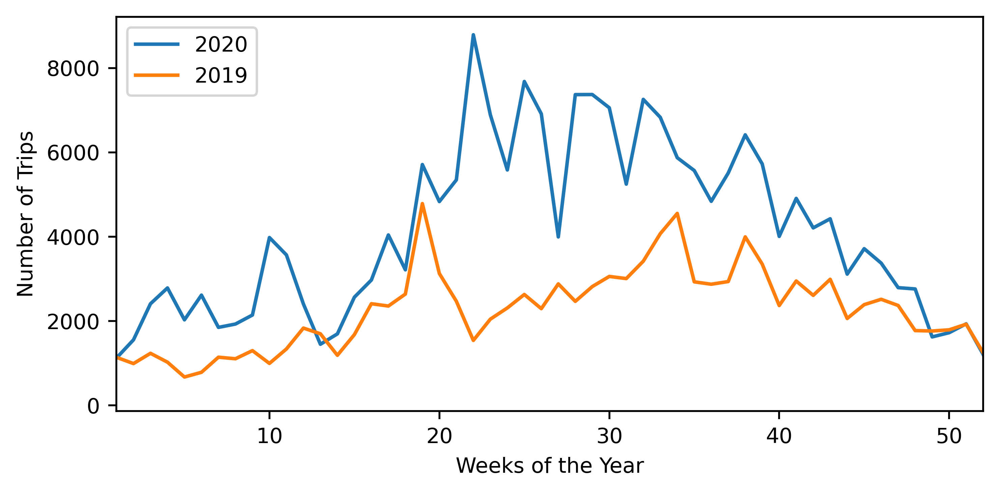

In [347]:
#Comparing yearly data
days = bike_data['started_at']
days = days[(days >= '2020-01-01') & (days < '2021-01-01')]
days = (days.groupby(days.dt.isocalendar().week).count())

days2 = bike_data['started_at']
days2 = days2[(days2 >= '2019-01-01') & (days2 < '2020-01-01')]
days2 = (days2.groupby(days2.dt.isocalendar().week).count())

fig, ax = plt.subplots(figsize=(6,3),dpi=500)
plt.plot(days, label='2020')
plt.plot(days2,label='2019')

plt.legend(loc='upper left')

ax.set_ylabel('Number of Trips')
ax.set_xlabel('Weeks of the Year')
#plt.title("Comparing Bike Usage in 2019 vs 2020")

ax.set_xlim(left=1)
ax.set_xlim(right=52)

plt.tight_layout()
plt.savefig('visualisations/2.pdf', bbox_inches='tight')

In [348]:
##Code for visualising average distance

#Function sourced from https://stackoverflow.com/questions/19412462/getting-distance-between-two-points-based-on-latitude-longitude
def haversine_vectorize(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    newlon = lon2 - lon1
    newlat = lat2 - lat1
    haver_formula = np.sin(newlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(newlon/2.0)**2
    dist = 2 * np.arcsin(np.sqrt(haver_formula ))
    km = 6367 * dist #6367 for distance in KM for miles use 3958
    return km

avg_dist = bike_data
avg_dist['haversine_dist'] = haversine_vectorize(avg_dist['start_station_latitude'], avg_dist['start_station_longitude'], avg_dist['end_station_latitude'], avg_dist['end_station_longitude'])


avg_dist['same_stop'] = np.where(avg_dist['start_station_name'] == avg_dist['end_station_name'], True, False) 


avg_dist1 = avg_dist[(avg_dist['started_at'] >= '2019-03-23') & (avg_dist['started_at'] < '2019-06-01')]
avg_dist2 = avg_dist[(avg_dist['started_at'] >= '2020-03-23') & (avg_dist['started_at'] < '2020-06-01')]
#avg_dist3 = avg_dist[(avg_dist['started_at'] >= '2019-01-01') & (avg_dist['started_at'] < '2019-03-23')]
#avg_dist4 = avg_dist[(avg_dist['started_at'] >= '2019-03-23') & (avg_dist['started_at'] < '2019-06-01')]

#le_bins = np.arange(0,10,0.25)
#fig, axs = plt.subplots(2, 2, figsize=(15,10), dpi=500)
##axs[0][0].hist(avg_dist1['haversine_dist'],bins=le_bins)
#axs[0][1].hist(avg_dist2['haversine_dist'],bins=le_bins)
#axs[1][0].hist(avg_dist3['haversine_dist'],bins=le_bins)
#axs[1][1].hist(avg_dist4['haversine_dist'],bins=le_bins);

#axs.set_ylabel('Number of Trips')
#axs.set_xlabel('Weeks of the Year')
#fig.suptitle("Distance between Starting Stations and End Stations")

(<Figure size 3000x1000 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x126661c10>)

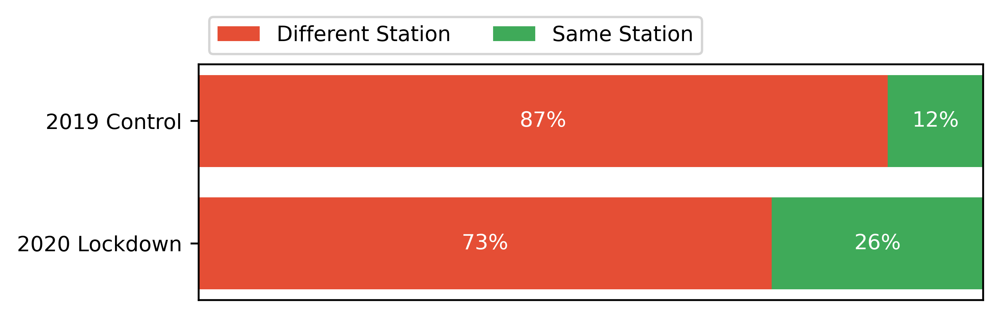

In [349]:
#fig, axs = plt.subplots(figsize=(6,3), dpi=500)

length1 = len(avg_dist1['same_stop'])
length2 = len(avg_dist2['same_stop'])


results = {
    '2019 Control' : [avg_dist1['same_stop'].value_counts()[0]/length1*100, avg_dist1['same_stop'].value_counts()[1]/length1*100],
    '2020 Lockdown' : [avg_dist2['same_stop'].value_counts()[0]/length2*100, avg_dist2['same_stop'].value_counts()[1]/length2*100]
}

category_names = ['Different Station', 'Same Station']


#The below code is adapted from:
#https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/horizontal_barchart_distribution.html
def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap('RdYlGn')(
        np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(6, 2),dpi=500)
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        ax.barh(labels, widths, left=starts, height=0.75,
                label=colname, color=color)
        xcenters = starts + widths / 2

        r, g, b, _ = color
        text_color = 'white' if r * g * b < 0.5 else 'darkgrey'
        for y, (x, c) in enumerate(zip(xcenters, widths)):
            ax.text(x, y, str(int(c)) +'%', ha='center', va='center',
                    color=text_color)
    ax.legend(ncol=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left')
    #fig.suptitle("Where Bikes are Returned", y=1.15)
    plt.tight_layout()
    plt.savefig('visualisations/3.pdf', bbox_inches='tight')

    return fig, ax

survey(results, category_names)


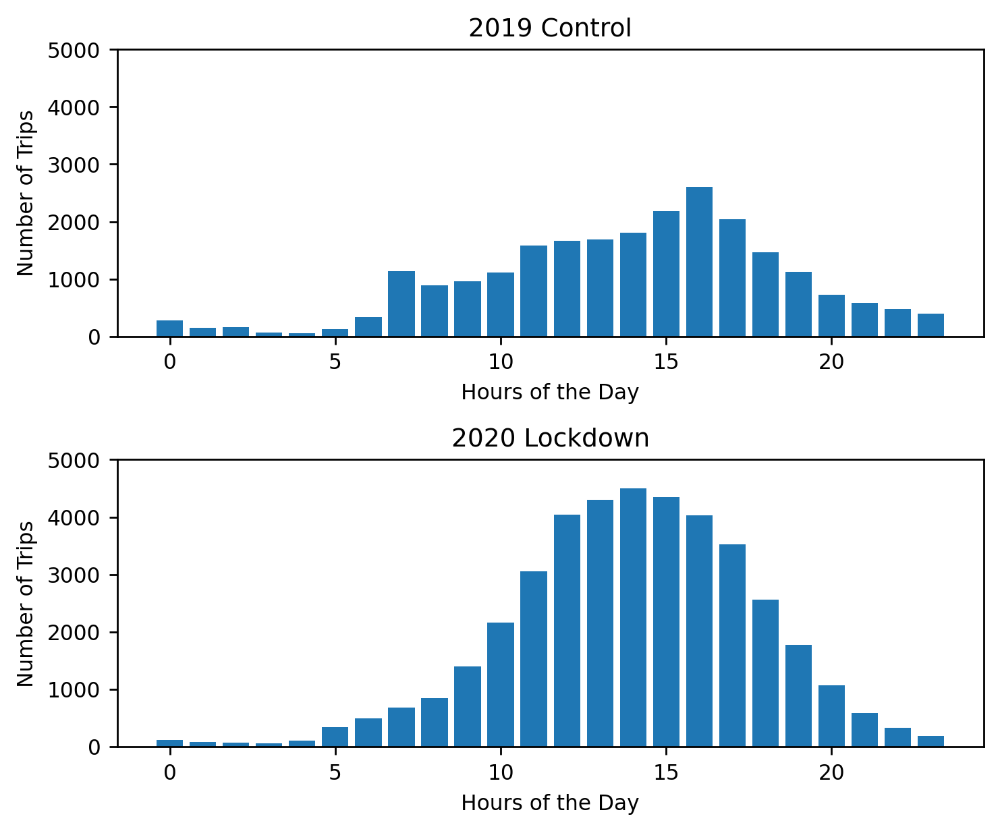

In [350]:
#Time of day bikes are rented

days = bike_data['started_at']

days1 = days[(days >= '2019-03-23') & (days < '2019-06-01')]
days1 = (days1.groupby(days1.dt.hour).count())

days2 = days[(days >= '2020-03-23') & (days < '2020-06-01')]
days2 = (days2.groupby(days2.dt.hour).count())

#days3 = days[(days >= '2019-01-01') & (days < '2019-03-23')]
#days3 = (days3.groupby(days3.dt.hour).count())

#days4 = days[(days >= '2019-03-23') & (days < '2019-06-01')]
#days4 = (days4.groupby(days4.dt.hour).count())

fig, axs = plt.subplots(2, 1, figsize=(6,5), dpi=250)
axs[0].bar(height=days1,x=np.arange(0,24))
axs[1].bar(height=days2,x=np.arange(0,24))
#axs[1][0].bar(height=days3,x=np.arange(0,24))
#axs[1][1].bar(height=days4,x=np.arange(0,24))
#fig.suptitle("Usage at Different Times of the Day", y=1.04)
axs[0].set_title("2019 Control")
axs[1].set_title("2020 Lockdown")

axs[0].set_xlabel('Hours of the Day')
axs[1].set_xlabel('Hours of the Day')
axs[0].set_ylabel('Number of Trips')
axs[1].set_ylabel('Number of Trips')

axs[0].set_ylim(top=5000)
axs[1].set_ylim(top=5000)

fig.tight_layout()
plt.savefig('visualisations/4.pdf', bbox_inches='tight')


In [351]:
#Time of day bikes are rented weekdays/weekends TEST

days = bike_data['started_at']

days1 = days[(days > '2019-03-23') & (days < '2019-06-01')]

days1a = days1[(days1.dt.weekday >= 0) & (days1.dt.weekday <= 4)]
days1a = (days1a.groupby(days1a.dt.hour).count())

days1b = days1[(days1.dt.weekday >= 5) & (days1.dt.weekday <= 6)]
days1b = (days1b.groupby(days1b.dt.hour).count())


days2 = days[(days > '2020-03-23') & (days < '2020-06-01')]

days2a = days2[(days2.dt.weekday >= 0) & (days2.dt.weekday <= 4)]
days2a = (days2a.groupby(days2a.dt.hour).count())

days2b = days2[(days2.dt.weekday >= 5) & (days2.dt.weekday <= 6)]
days2b = (days2b.groupby(days2b.dt.hour).count())


#days3 = days[(days > '2019-01-01') & (days < '2019-03-23')]
#days3 = (days3.groupby(days3.dt.hour).count())

#days4 = days[(days > '2019-03-23') & (days < '2019-06-01')]
#days4 = (days4.groupby(days4.dt.hour).count())

#le_bins = np.arange(0,24,1)
#fig, axs = plt.subplots(2, 2, figsize=(9,6), dpi=500)
#axs[0][0].bar(height=days1a,x=le_bins)
#axs[0][1].bar(height=days1b,x=le_bins)
#axs[1][0].bar(height=days2a,x=le_bins)
#axs[1][1].bar(height=days2b,x=le_bins)

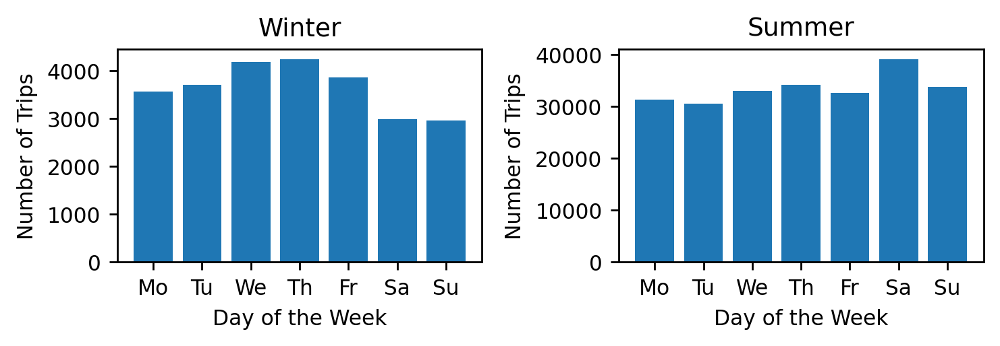

In [572]:
#Rentals per day of week winter/summer 2019

days = bike_data['started_at']

days1 = days[(days >= '2019-12-01') & (days < '2020-03-01')]
days1 = (days1.groupby(days1.dt.dayofweek).count())

days2 = days[(days >= '2019-06-01') & (days < '2020-09-01')]
days2 = (days2.groupby(days2.dt.dayofweek).count())

labels = ['Mo','Tu','We','Th','Fr','Sa','Su']
fig, axs = plt.subplots(1, 2, figsize=(6,2.13), dpi=250)
axs[0].bar(height=days1,x=labels)
axs[1].bar(height=days2,x=labels)

for ax in fig.axes:
    ax.tick_params(labelrotation=0)
    
    
#fig.suptitle("Winter/Summer Usage per Days of the Week", y=1.04)
axs[0].set_title("Winter")
axs[1].set_title("Summer")

axs[0].set_ylabel('Number of Trips')
axs[1].set_ylabel('Number of Trips')
axs[0].set_xlabel('Day of the Week')
axs[1].set_xlabel('Day of the Week')

fig.tight_layout()
plt.savefig('visualisations/5.pdf', bbox_inches='tight')

In [455]:
#Popular stations winter/summer 2019

station_pop = bike_data
station_pop['popularity'] = 0
#station_pop['haversine_dist_start'] = haversine_vectorize(-3.189223922703719, 55.9441040959390, station_pop['start_station_longitude'], station_pop['start_station_latitude'])

station_pop1 = station_pop[(station_pop.started_at >= '2019-12-01') & (station_pop.started_at < '2020-03-01')]
station_pop1 = (station_pop1.groupby(station_pop1.start_station_name).count()).reset_index()
station_pop1 = station_pop1[['start_station_name','popularity']]
station_pop1 = station_pop1.sort_values(by='popularity', ascending=False)

station_pop2 = station_pop[(station_pop.started_at >= '2019-06-01') & (station_pop.started_at < '2020-09-01')]
station_pop2 = (station_pop2.groupby(station_pop2.start_station_name).count()).reset_index()
station_pop2 = station_pop2[['start_station_name','popularity']]
station_pop2 = station_pop2.sort_values(by='popularity', ascending=False)

print(station_pop1.head(5))
print("\n\n")
print(station_pop2.head(5))

   start_station_name  popularity
66       Meadows East        1137
85   St Andrew Square         886
4       Bristo Square         829
65       Meadow Place         733
40      George Square         719



          start_station_name  popularity
96              Meadows East        8049
127         St Andrew Square        6797
6              Bristo Square        6689
93              Meadow Place        6424
112  Portobello - Kings Road        6374


<ipython-input-353-f6e552595f7e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duration['delta'] = (duration['ended_at'] - duration['started_at'])
<ipython-input-353-f6e552595f7e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duration['delta'] = duration['delta'].dt.seconds


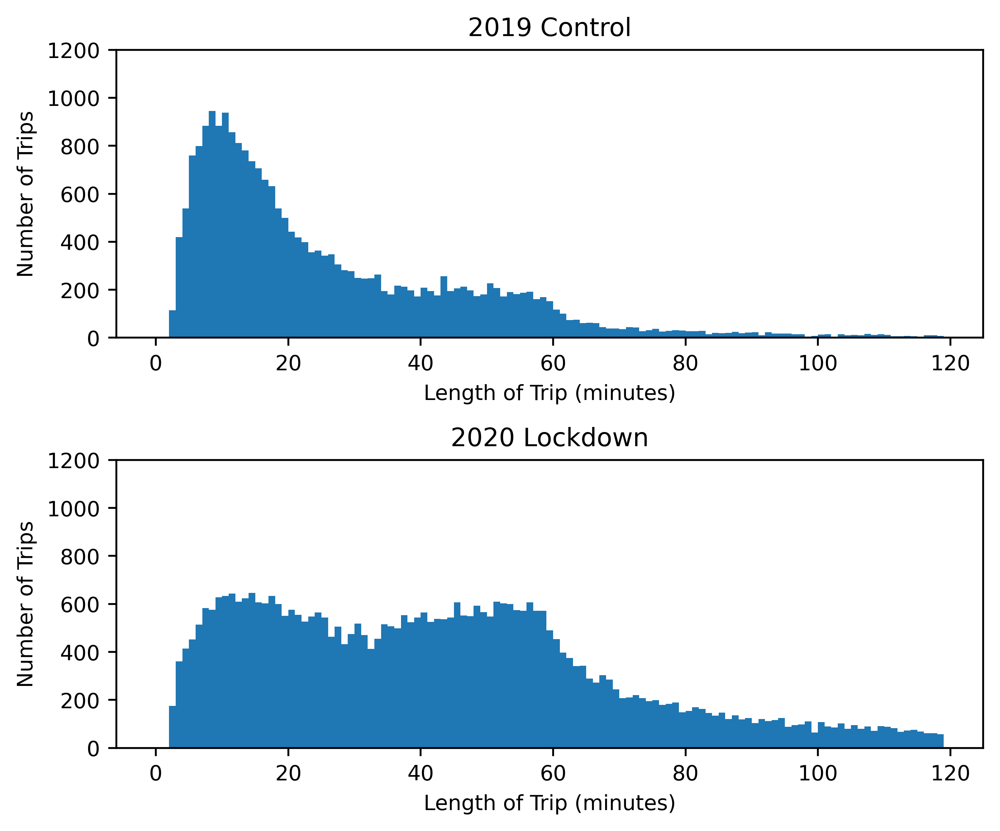

In [353]:
#trip duration
duration = bike_data[['started_at','ended_at']]
duration['delta'] = (duration['ended_at'] - duration['started_at'])
duration['delta'] = duration['delta'].dt.seconds

duration1 = duration[(duration['started_at'] >= '2019-03-23') & (duration['started_at'] < '2019-06-01')]
duration2 = duration[(duration['started_at'] >= '2020-03-23') & (duration['started_at'] < '2020-06-01')]
#duration3 = duration[(duration['started_at'] >= '2019-01-01') & (duration['started_at'] < '2019-03-23')]
#duration4 = duration[(duration['started_at'] >= '2019-03-23') & (duration['started_at'] < '2019-06-01')]

le_bins = np.arange(0,7200/60,1)
fig, axs = plt.subplots(2, 1, figsize=(6,5), dpi=500)
axs[0].hist(duration1['delta']/60, bins=le_bins)
axs[1].hist(duration2['delta']/60, bins=le_bins)
#axs[1][0].hist(duration3['delta']/60, bins=le_bins)
#axs[1][1].hist(duration4['delta']/60, bins=le_bins)

#fig.suptitle("Distribution of Trip Durations", y=1.04)
axs[0].set_title("2019 Control")
axs[1].set_title("2020 Lockdown")

axs[0].set_xlabel('Length of Trip (minutes)')
axs[1].set_xlabel('Length of Trip (minutes)')
axs[0].set_ylabel('Number of Trips')
axs[1].set_ylabel('Number of Trips')

axs[0].set_ylim(top=1200)
axs[1].set_ylim(top=1200)

plt.tight_layout()
plt.savefig('visualisations/6.pdf', bbox_inches='tight')


In [354]:
#Trip duration over time ??

#map of routes??

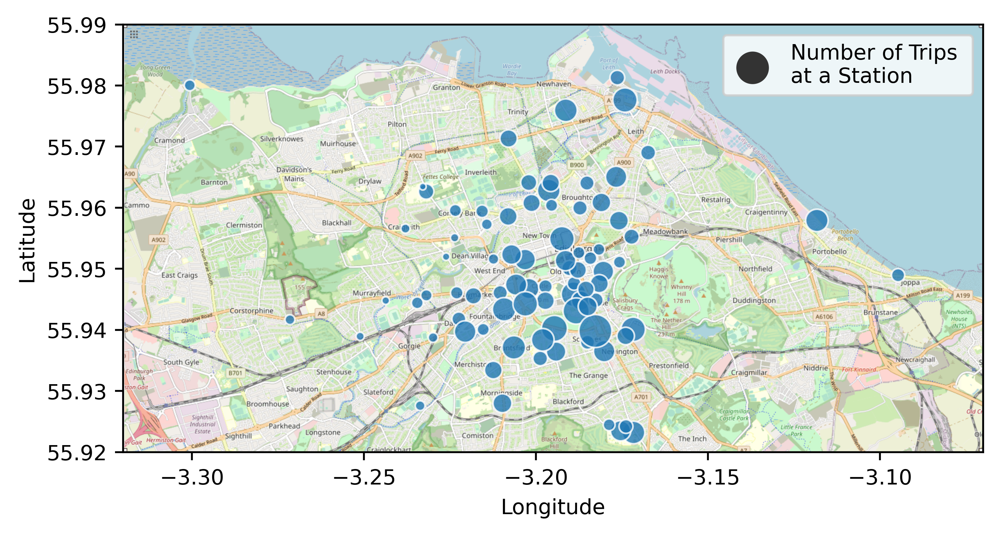

In [558]:
#map of busiest locations

#combine the count of start and end points (pain)
#normalised bubbles

init_map = bike_data
init_map =  init_map[(init_map['started_at'] >= '2020-01-01') & (init_map['started_at'] < '2020-03-23')]
#init_map =  init_map[(init_map['started_at'] >= '2019-03-23') & (init_map['started_at'] < '2019-06-01')]


station_map = init_map[['started_at','start_station_name','start_station_latitude', 'start_station_longitude']]
station_map2 = init_map[['started_at','end_station_name','end_station_latitude', 'end_station_longitude']]

station_map = station_map.rename(columns={'start_station_name':'station', 'start_station_latitude': 'Latitude', 'start_station_longitude' : 'Longitude'})
station_map2 = station_map2.rename(columns={'end_station_name':'station', 'end_station_latitude': 'Latitude', 'end_station_longitude' : 'Longitude'})

station_map = station_map.groupby(['station','Latitude', 'Longitude']).size()
station_map2= station_map2.groupby(['station','Latitude', 'Longitude']).size()

#combine start and end stations for accurate count
station_map_all = station_map + station_map2
station_map_all = station_map_all.to_frame(name = 'Frequency').reset_index()

#Filter least used stations
station_map_all = station_map_all[(station_map_all['Frequency'] >= 100)]

edi_map = mpimg.imread("datasets/map.png")

#fig, axs = plt.subplots(2, 2)
plt.figure(dpi=500, figsize=(6,3.25))
g = sns.scatterplot(data=station_map_all, x='Longitude', y='Latitude', size='Frequency', sizes=(0.01, 500), alpha = 0.8, size_norm=(0,6000))
axes = plt.gca()
axes.set_xlim([-3.32,-3.07])
axes.set_ylim([55.92,55.99])
plt.imshow(edi_map, extent=(-3.32,-3.07,55.92,55.99), aspect="auto")
#plt.title("Popular Start/End Stations Before Lockdown")
legend_labels, _= g.get_legend_handles_labels()
plt.legend(legend_labels[2:], ['Number of Trips \nat a Station'],loc=0, labelspacing=1)
plt.tight_layout()
plt.savefig('visualisations/7.1.pdf', bbox_inches='tight')
plt.show(g)

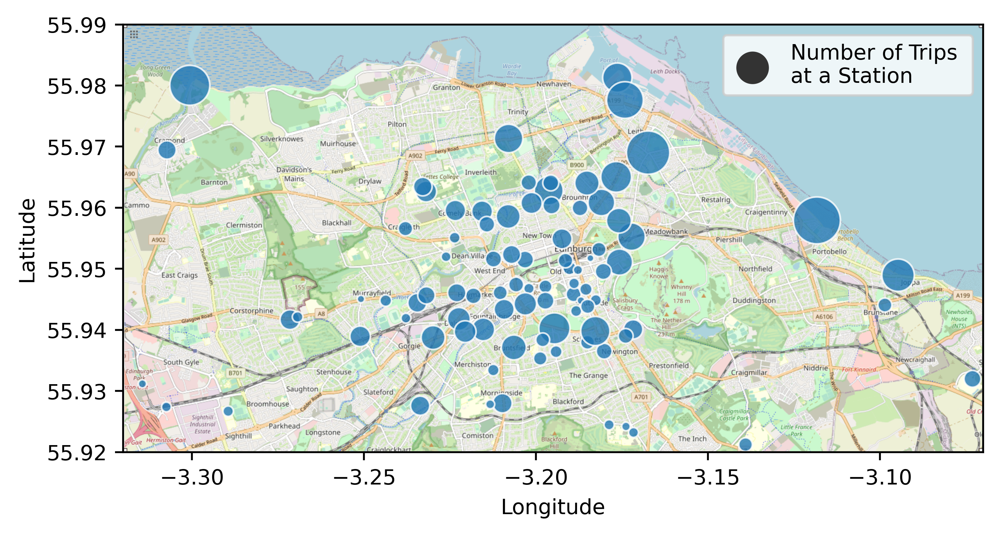

In [559]:
init_map = bike_data
init_map =  init_map[(init_map['started_at'] >= '2020-03-23') & (init_map['started_at'] < '2020-06-01')]

station_map = init_map[['started_at','start_station_name','start_station_latitude', 'start_station_longitude']]
station_map2 = init_map[['started_at','end_station_name','end_station_latitude', 'end_station_longitude']]

station_map = station_map.rename(columns={'start_station_name':'station', 'start_station_latitude': 'Latitude', 'start_station_longitude' : 'Longitude'})
station_map2 = station_map2.rename(columns={'end_station_name':'station', 'end_station_latitude': 'Latitude', 'end_station_longitude' : 'Longitude'})

station_map = station_map.groupby(['station','Latitude', 'Longitude']).size()
station_map2= station_map2.groupby(['station','Latitude', 'Longitude']).size()

#combine start and end stations for accurate count
station_map_all = station_map + station_map2
station_map_all = station_map_all.to_frame(name = 'Frequency').reset_index()

#Filter least used stations
station_map_all = station_map_all[(station_map_all['Frequency'] >= 100)]

edi_map = mpimg.imread("datasets/map.png")

#fig, axs = plt.subplots(2, 2)
plt.figure(dpi=500, figsize=(6,3.25))
g = sns.scatterplot(data=station_map_all, x='Longitude', y='Latitude', size='Frequency', sizes=(0.01, 500), alpha = 0.8, size_norm=(0,6000))
axes = plt.gca()
axes.set_xlim([-3.32,-3.07])
axes.set_ylim([55.92,55.99])
plt.imshow(edi_map, extent=(-3.32,-3.07,55.92,55.99), aspect="auto")
#plt.title("Popular Start/End Stations Before Lockdown")
legend_labels, _= g.get_legend_handles_labels()
plt.legend(legend_labels[2:], ['Number of Trips \nat a Station'],loc=0, labelspacing=1)
plt.tight_layout()
plt.savefig('visualisations/7.2.pdf', bbox_inches='tight')
plt.show(g)